# Supplementary figures — copied from `../Fig1_Expression_vs_UP.ipynb`

**This is a near-verbatim copy of the source notebook**, not a cleaned
reproduction. Only inert cells were removed: empty cells, cells that are
entirely commented out, and cells that only `print()` or display a table.
Every cell that computes or plots anything is untouched.

Panels produced here: `UP_splicing_by_exppression.*` (10 panels), `expression_ranks`

Two mechanical path edits were applied so the notebook runs from this directory
and cannot overwrite the published figures:

* `../code/...` → `../../code/...` (this notebook sits one level deeper)
* `../code/plots/` → `plots/` and `../code/revision_plots/` → `revision_plots/`

Cells unrelated to the supplementary panels were **kept**, so this notebook may
compute more than it needs to. That is the trade for not re-tracing it.

In [14]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import gzip
from tqdm import tqdm
from pybedtools import BedTool
import re
from scipy.stats import spearmanr, pearsonr
from sklearn.preprocessing import scale

In [15]:
genes = pd.read_csv('/project/yangili1/cdai/genome_index/hs38/gencode_gene_v38_anno.bed', sep='\t',
                   names = ['chrom', 'start', 'end', 'gene', 'score', 'strand'])

In [16]:
gtex_colors = {
  "Adipose-Subcutaneous": {
    "tissue_abbrv": "ADPSBQ", 
    "tissue_color_hex": "FFA54F", 
    "tissue_color_rgb": "255,165,79"
  }, 
  "Adipose-Visceral_Omentum": {
    "tissue_abbrv": "ADPVSC", 
    "tissue_color_hex": "EE9A00", 
    "tissue_color_rgb": "238,154,0"
  }, 
  "AdrenalGland": {
    "tissue_abbrv": "ADRNLG", 
    "tissue_color_hex": "8FBC8F", 
    "tissue_color_rgb": "143,188,143"
  }, 
  "Artery-Aorta": {
    "tissue_abbrv": "ARTAORT", 
    "tissue_color_hex": "8B1C62", 
    "tissue_color_rgb": "139,28,98"
  }, 
  "Artery-Coronary": {
    "tissue_abbrv": "ARTCRN", 
    "tissue_color_hex": "EE6A50", 
    "tissue_color_rgb": "238,106,80"
  }, 
  "Artery-Femoral": {
    "tissue_abbrv": "ARTFMR", 
    "tissue_color_hex": "FF4500", 
    "tissue_color_rgb": "255,69,0"
  }, 
  "Artery-Tibial": {
    "tissue_abbrv": "ARTTBL", 
    "tissue_color_hex": "FF0000", 
    "tissue_color_rgb": "255,0,0"
  }, 
  "Bladder": {
    "tissue_abbrv": "BLDDER", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Brain-Amygdala": {
    "tissue_abbrv": "BRNAMY", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Anteriorcingulatecortex_BA24": {
    "tissue_abbrv": "BRNACC", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Caudate_basalganglia": {
    "tissue_abbrv": "BRNCDT", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-CerebellarHemisphere": {
    "tissue_abbrv": "BRNCHB", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Cerebellum": {
    "tissue_abbrv": "BRNCHA", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Cortex": {
    "tissue_abbrv": "BRNCTXA", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-FrontalCortex_BA9": {
    "tissue_abbrv": "BRNCTXB", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Hippocampus": {
    "tissue_abbrv": "BRNHPP", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Hypothalamus": {
    "tissue_abbrv": "BRNHPT", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Nucleusaccumbens_basalganglia": {
    "tissue_abbrv": "BRNNCC", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Putamen_basalganglia": {
    "tissue_abbrv": "BRNPTM", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Spinalcord_cervicalc-1": {
    "tissue_abbrv": "BRNSPC", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Substantianigra": {
    "tissue_abbrv": "BRNSNG", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Breast-MammaryTissue": {
    "tissue_abbrv": "BREAST", 
    "tissue_color_hex": "00CDCD", 
    "tissue_color_rgb": "0,205,205"
  }, 
  "Cells-EBV-transformedlymphocytes": {
    "tissue_abbrv": "LCL", 
    "tissue_color_hex": "EE82EE", 
    "tissue_color_rgb": "238,130,238"
  }, 
  "Cells-Culturedfibroblasts": {
    "tissue_abbrv": "FIBRBLS", 
    "tissue_color_hex": "9AC0CD", 
    "tissue_color_rgb": "154,192,205"
  }, 
  "Cervix-Ectocervix": {
    "tissue_abbrv": "CVXECT", 
    "tissue_color_hex": "EED5D2", 
    "tissue_color_rgb": "238,213,210"
  }, 
  "Cervix-Endocervix": {
    "tissue_abbrv": "CVSEND", 
    "tissue_color_hex": "EED5D2", 
    "tissue_color_rgb": "238,213,210"
  }, 
  "Colon-Sigmoid": {
    "tissue_abbrv": "CLNSGM", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Colon-Transverse": {
    "tissue_abbrv": "CLNTRN", 
    "tissue_color_hex": "EEC591", 
    "tissue_color_rgb": "238,197,145"
  }, 
  "Esophagus-GastroesophagealJunction": {
    "tissue_abbrv": "ESPGEJ", 
    "tissue_color_hex": "8B7355", 
    "tissue_color_rgb": "139,115,85"
  }, 
  "Esophagus-Mucosa": {
    "tissue_abbrv": "ESPMCS", 
    "tissue_color_hex": "8B7355", 
    "tissue_color_rgb": "139,115,85"
  }, 
  "Esophagus-Muscularis": {
    "tissue_abbrv": "ESPMSL", 
    "tissue_color_hex": "CDAA7D", 
    "tissue_color_rgb": "205,170,125"
  }, 
  "FallopianTube": {
    "tissue_abbrv": "FLLPNT", 
    "tissue_color_hex": "EED5D2", 
    "tissue_color_rgb": "238,213,210"
  }, 
  "Heart-AtrialAppendage": {
    "tissue_abbrv": "HRTAA", 
    "tissue_color_hex": "B452CD", 
    "tissue_color_rgb": "180,82,205"
  }, 
  "Heart-LeftVentricle": {
    "tissue_abbrv": "HRTLV", 
    "tissue_color_hex": "7A378B", 
    "tissue_color_rgb": "122,55,139"
  }, 
  "Kidney-Cortex": {
    "tissue_abbrv": "KDNCTX", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Kidney-Medulla": {
    "tissue_abbrv": "KDNMDL", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Liver": {
    "tissue_abbrv": "LIVER", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Lung": {
    "tissue_abbrv": "LUNG", 
    "tissue_color_hex": "9ACD32", 
    "tissue_color_rgb": "154,205,50"
  }, 
  "MinorSalivaryGland": {
    "tissue_abbrv": "SLVRYG", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Muscle-Skeletal": {
    "tissue_abbrv": "MSCLSK", 
    "tissue_color_hex": "7A67EE", 
    "tissue_color_rgb": "122,103,238"
  }, 
  "Nerve-Tibial": {
    "tissue_abbrv": "NERVET", 
    "tissue_color_hex": "FFD700", 
    "tissue_color_rgb": "255,215,0"
  }, 
  "Ovary": {
    "tissue_abbrv": "OVARY", 
    "tissue_color_hex": "FFB6C1", 
    "tissue_color_rgb": "255,182,193"
  }, 
  "Pancreas": {
    "tissue_abbrv": "PNCREAS", 
    "tissue_color_hex": "CD9B1D", 
    "tissue_color_rgb": "205,155,29"
  }, 
  "Pituitary": {
    "tissue_abbrv": "PTTARY", 
    "tissue_color_hex": "B4EEB4", 
    "tissue_color_rgb": "180,238,180"
  }, 
  "Prostate": {
    "tissue_abbrv": "PRSTTE", 
    "tissue_color_hex": "D9D9D9", 
    "tissue_color_rgb": "217,217,217"
  }, 
  "Skin-NotSunExposed_Suprapubic": {
    "tissue_abbrv": "SKINNS", 
    "tissue_color_hex": "3A5FCD", 
    "tissue_color_rgb": "58,95,205"
  }, 
  "Skin-SunExposed_Lowerleg": {
    "tissue_abbrv": "SKINS", 
    "tissue_color_hex": "1E90FF", 
    "tissue_color_rgb": "30,144,255"
  }, 
  "SmallIntestine-TerminalIleum": {
    "tissue_abbrv": "SNTTRM", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Spleen": {
    "tissue_abbrv": "SPLEEN", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Stomach": {
    "tissue_abbrv": "STMACH", 
    "tissue_color_hex": "FFD39B", 
    "tissue_color_rgb": "255,211,155"
  }, 
  "Testis": {
    "tissue_abbrv": "TESTIS", 
    "tissue_color_hex": "A6A6A6", 
    "tissue_color_rgb": "166,166,166"
  }, 
  "Thyroid": {
    "tissue_abbrv": "THYROID", 
    "tissue_color_hex": "008B45", 
    "tissue_color_rgb": "0,139,69"
  }, 
  "Uterus": {
    "tissue_abbrv": "UTERUS", 
    "tissue_color_hex": "EED5D2", 
    "tissue_color_rgb": "238,213,210"
  }, 
  "Vagina": {
    "tissue_abbrv": "VAGINA", 
    "tissue_color_hex": "EED5D2", 
    "tissue_color_rgb": "238,213,210"
  }, 
  "WholeBlood": {
    "tissue_abbrv": "WHLBLD", 
    "tissue_color_hex": "FF00FF", 
    "tissue_color_rgb": "255,0,255"
  }
}

In [17]:
import pybedtools

def transform_string(s):
    s = s.replace(" ", "")  # Remove spaces
    s = re.sub(r"\(", "_", s)  # Replace '(' with '_'
    s = re.sub(r"\)", "", s)  # Remove ')'
    return s

median_expression = pd.read_csv('/project2/mstephens/cfbuenabadn/gtex-stm/code/gtex_tables/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_median_tpm.gct.gz',
                               sep='\t', skiprows=2)

median_expression.columns = [transform_string(x) for x in median_expression.columns]
median_expression['gene'] = median_expression.Name.apply(lambda x: x.split('.')[0])

In [18]:
genes_df = pd.read_csv('/project2/mstephens/cfbuenabadn/gtex-stm/data/all_genes.protein_coding.bed.gz', sep='\t',
                    names = ['chrom', 'start', 'end', 'ensemblID', 'gene_name', 'strand'])
genes_df.start -= 1
genes_df.end += 1

In [19]:
def get_juncs_by_gene(tissue, genes_df):
    bed = []
    ms_juncs = []
    ms_class = []
    with gzip.open(f'/project/yangili1/cfbuenabadn/SpliFi/code/results/pheno/noisy/GTEx/{tissue}/leafcutter_perind_numers.counts.noise_by_intron.gz',
                   'rb') as ms:
        ms.readline()
        for linea in tqdm(ms):
            row = linea.decode().split(' ')
            junc = row[0]
            chrom, start, end, clu, annot = junc.split(':')
            strand = clu.split('_')[-1]
    
            out_junc = ':'.join([chrom, start, end, strand])
    
            ms_juncs.append(out_junc)
            ms_class.append(annot)
    
            
    
            counts = [int(x) for x in row[1:]]
            sum_counts = np.sum(counts)
    
            bed_row = [chrom, start, end, out_junc, annot, strand, sum_counts]
            bed.append(bed_row)
    
    
    introns_df = pd.DataFrame(bed, columns = ['chrom', 'start', 'end', 'junc', 'annot', 'strand', 'counts'])
    
    introns_bed = BedTool.from_dataframe(introns_df)
    genes_bed = pybedtools.BedTool.from_dataframe(genes_df)
    
    olaps = introns_bed.intersect(
        genes_bed,
        f=1.0,      # A must be fully covered
        # r=True,     # reciprocal not strictly needed but matches "within"
        s=True,     # strand-specific
        wo=True     # report all overlaps + overlap length
    )
    
    juncs_with_gene = olaps.to_dataframe(names = ['chrom_junc', 'start_junc', 'end_junc', 'junc', 'annot', 'junc_strand', 'counts',
                               'chrom_gene', 'start_gene', 'end_gene', 'ensembl_id', 'gene', 'gene_strand', 'olaps'])
    
    juncs_grouped = juncs_with_gene.groupby('junc').gene.unique()
    
    keep_junc = []
    for x in juncs_grouped:
        if len(x) == 1:
            keep_junc.append(True)
        else:
            keep_junc.append(False)
    
    keep_junc = np.array(keep_junc)
    
    juncs_final = juncs_with_gene.loc[juncs_with_gene.junc.isin(juncs_grouped.loc[keep_junc].index)]
    juncs_final.to_csv(f'../../code/results/juncs_with_gene/{tissue}.tab.gz', sep='\t', index = False, header=True)

In [20]:
def plot_cumulative(x, steps = 100):
    '''
    Function to get cumulative distribution.
    '''
    x = np.array(x)
    X = np.linspace(np.min(x), np.max(x), steps)
    y = [np.mean(x<=z) for z in X]
    return X, y

In [21]:
import os
tissues = os.listdir('/project/yangili1/cfbuenabadn/SpliFi/code/results/pheno/noisy/GTEx/')

In [22]:
for tissue in tissues:
    get_juncs_by_gene(tissue, genes_df)

0it [00:00, ?it/s]

102305it [00:03, 31284.45it/s]
100393it [00:03, 25387.58it/s]
103296it [00:05, 17242.20it/s]
106105it [00:10, 10274.02it/s]
98137it [00:07, 13408.95it/s]
128328it [00:07, 17428.17it/s]
109912it [00:10, 10515.65it/s]
100056it [00:02, 38462.99it/s]
95357it [00:10, 8826.96it/s]
114311it [00:09, 11862.26it/s]
100389it [00:02, 36343.44it/s]
88952it [00:03, 27374.02it/s]
101510it [00:04, 24738.08it/s]
89607it [00:10, 8933.99it/s] 
108774it [00:14, 7430.78it/s]
97921it [00:03, 31358.85it/s]
102250it [00:05, 17681.07it/s]
105312it [00:06, 15498.55it/s]
107100it [00:20, 5291.20it/s]
110122it [00:10, 10621.32it/s]
103219it [00:09, 11116.68it/s]
98231it [00:07, 13371.67it/s]
102123it [00:18, 5407.70it/s]
101029it [00:06, 14555.08it/s]
105032it [00:07, 13825.95it/s]
101166it [00:04, 24390.46it/s]
109170it [00:07, 15291.75it/s]
93397it [00:12, 7357.36it/s]
102033it [00:07, 13795.48it/s]
103113it [00:09, 11324.89it/s]
104736it [00:12, 8294.60it/s]
109601it [00:20, 5260.18it/s]
93881it [00:12, 7575.2

In [23]:
get_juncs_by_gene('Testis', genes_df)

0it [00:00, ?it/s]

128328it [00:08, 16023.96it/s]


In [24]:
def get_UP_table(tissue):
    bc_df = pd.read_csv(f'../../code/results/juncs_with_gene/{tissue}.tab.gz', sep='\t')
    bc_summary = bc_df.groupby(['ensembl_id', 'annot']).counts.sum().reset_index()

    bc_total_counts = bc_summary.groupby('ensembl_id').counts.sum().reset_index()
    bc_total_counts.columns = ['ensembl_id', 'total_counts']

    bc_PR_counts = bc_summary.loc[bc_summary.annot == 'PR', ['ensembl_id', 'counts']]
    bc_PR_counts.columns = ['ensembl_id', 'PR_counts']
    
    bc_UP_counts = bc_summary.loc[bc_summary.annot == 'UP', ['ensembl_id', 'counts']]
    bc_UP_counts.columns = ['ensembl_id', 'UP_counts']

    bc_nonPR_counts = bc_summary.loc[bc_summary.annot != 'PR', ['ensembl_id', 'counts']]
    bc_nonPR_counts.columns = ['ensembl_id', 'nonPR_counts']
    
    
    bc_merged = bc_total_counts.merge(
        bc_PR_counts, on='ensembl_id', #how='outer'
    ).merge(
        bc_UP_counts, on='ensembl_id', #how='outer'
    ).merge(
        bc_nonPR_counts, on='ensembl_id', #how='outer'
    ).fillna(0)
    
    
    bc_merged['UP_percentage'] = (bc_merged.UP_counts / bc_merged.total_counts)*100
    bc_merged['nonPR_percentage'] = (bc_merged.nonPR_counts / bc_merged.total_counts)*100

    return bc_merged

    # bc_merged = bc_merged.loc[bc_merged.counts_x >= 100]

def get_splicing_expression(up_table, median_expression, tissue2, tissues_median = None):
    shared_genes = pd.Index(up_table.ensembl_id).intersection(pd.Index(median_expression.gene))

    if tissues_median is not None:
        med_exp = list(median_expression[tissues_median].median(axis=1))
        bc_median = pd.DataFrame({'gene':list(median_expression.gene), 'expression':med_exp})
        bc_median = bc_median.loc[bc_median.gene.isin(shared_genes)]

    else:

        bc_median = median_expression.loc[median_expression.gene.isin(shared_genes), ['gene', tissue2]]
        bc_median.columns = ['gene', 'expression']
        
    bc_splicing_expression = up_table.merge(bc_median, left_on = 'ensembl_id', right_on = 'gene').dropna()
    
    bc_splicing_expression['logUP'] = np.log10(np.maximum(0.001, bc_splicing_expression.UP_percentage))
    bc_splicing_expression['lognonPR'] = np.log10(np.maximum(0.001, bc_splicing_expression.nonPR_percentage))

    return bc_splicing_expression

def process_tissue_pair(tissue1, tissue2, median_expression, tissues_median = None):
    up_table = get_UP_table(tissue1)
    splicing_expression = get_splicing_expression(up_table, median_expression, tissue2, tissues_median)
    return up_table, splicing_expression

In [25]:
def get_splicing_expression(up_table, median_expression, tissue2, tissues_median = None):
    shared_genes = pd.Index(up_table.ensembl_id).intersection(pd.Index(median_expression.gene))

    if tissues_median is not None:
        med_exp = list(median_expression[tissues_median].median(axis=1))
        bc_median = pd.DataFrame({'gene':list(median_expression.gene), 'expression':med_exp})
        bc_median = bc_median.loc[bc_median.gene.isin(shared_genes)]

    else:

        bc_median = median_expression.loc[median_expression.gene.isin(shared_genes), ['gene', tissue2]]
        bc_median.columns = ['gene', 'expression']
        
    bc_splicing_expression = up_table.merge(bc_median, left_on = 'ensembl_id', right_on = 'gene').dropna()
    
    bc_splicing_expression['logUP'] = np.log10(np.maximum(0.001, bc_splicing_expression.UP_percentage))
    bc_splicing_expression['lognonPR'] = np.log10(np.maximum(0.001, bc_splicing_expression.nonPR_percentage))

    return bc_splicing_expression

def process_tissue_pair(tissue1, tissue2, median_expression, tissues_median = None):
    up_table = get_UP_table(tissue1)
    splicing_expression = get_splicing_expression(up_table, median_expression, tissue2, tissues_median)
    return up_table, splicing_expression

In [27]:
bc_up_table, bc_splicing_expression = process_tissue_pair('Brain-Cortex', 'Brain-Cortex', median_expression)

mexp = median_expression.loc[median_expression.gene.isin(bc_up_table.ensembl_id), median_expression.columns[2:-1]]

exp_quintiles = mexp.apply(lambda col: pd.qcut(col.rank(method='average'), q=5, labels=[1, 2, 3, 4, 5])).astype(int)



In [28]:
up_table, splicing_expression = process_tissue_pair('Testis', 'Testis', median_expression, ['Brain-Cortex'])

In [29]:
bc_up_table, bc_splicing_expression = process_tissue_pair('Brain-Cortex', 'Brain-Cortex', median_expression)

In [30]:
pearsonr(bc_splicing_expression.logUP, np.log1p(bc_splicing_expression.expression), 
            )

PearsonRResult(statistic=np.float64(-0.49801205633593), pvalue=np.float64(0.0))

In [31]:
bc_up_table, bc_splicing_expression = process_tissue_pair('Testis', 'Testis', median_expression)

In [32]:
bc_splicing_expression.drop_duplicates().groupby('gene')

In [33]:
from tqdm import tqdm
exp_df = pd.DataFrame()
up_df = pd.DataFrame()
for tissue in tqdm(tissues):
    bc_up_table, bc_splicing_expression = process_tissue_pair(tissue, tissue, median_expression)


    tissue_exp_df = pd.DataFrame(bc_splicing_expression.drop_duplicates().groupby('gene').expression.mean())
    tissue_up_df = pd.DataFrame(bc_splicing_expression.drop_duplicates().groupby('gene').UP_percentage.mean())

    tissue_exp_df.columns = [f'{tissue}']
    tissue_up_df.columns = [f'{tissue}']
                             
    
    # tissue_splicing_expression = bc_splicing_expression.drop_duplicates().groupby('gene')[['expression', 'logUP', 'lognonPR']].mean()#.reset_index()
    # tissue_splicing_expression.columns = [f'{tissue}_expression', f'{tissue}_logUP', f'{tissue}_lognonPR']

    exp_df = exp_df.merge(tissue_exp_df, right_index = True, left_index = True, how='outer')
    up_df = up_df.merge(tissue_up_df, right_index = True, left_index = True, how='outer')

100%|██████████| 49/49 [00:16<00:00,  3.02it/s]


In [35]:
def qcut_rows(df, N):
    return df.apply(
        lambda row: pd.qcut(
            row,
            q=N,
            labels=False,
            duplicates="drop"
        ) + 1,
        axis=1
    )

exp_deciles = qcut_rows(exp_df.rank(axis=1), 10)
up_deciles = qcut_rows(up_df.rank(axis=1), 10)

In [37]:
import numpy as np

def rank_overlap_matrix(A, B):
    """
    A, B: arrays of shape (R, N) with ranks 1..N per row, possibly containing NaNs
    Returns: (N, N) overlap matrix
    """
    A = np.asarray(A)
    B = np.asarray(B)

    # Mask valid entries (both A and B observed)
    mask = ~np.isnan(A) & ~np.isnan(B)

    # Convert to 0-based ranks
    A0 = A[mask].astype(int) - 1
    B0 = B[mask].astype(int) - 1

    N = int(np.nanmax([A, B]))

    M = np.zeros((N, N), dtype=int)
    np.add.at(M, (A0, B0), 1)

    return M


X = rank_overlap_matrix(exp_deciles, up_deciles)

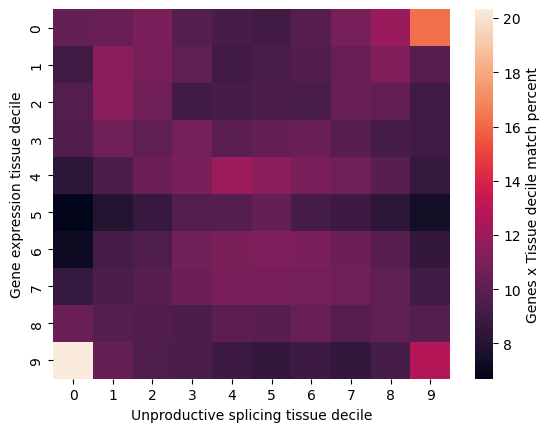

In [38]:
sns.heatmap(100*X/X.sum(axis=1), cbar_kws={'label': 'Genes x Tissue decile match percent'})
plt.xlabel('Unproductive splicing tissue decile')
plt.ylabel('Gene expression tissue decile')

plt.savefig('revision_plots/expression_ranks.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/expression_ranks.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/expression_ranks.svg', dpi=300, bbox_inches='tight')    

In [39]:
100*X/X.sum(axis=1)

array([[10.23026438, 10.39383355, 10.93448347,  9.71287209,  9.26233397,
         9.05176449,  9.76073391, 10.82170793, 11.9458531 , 16.19251096],
       [ 9.05484074, 11.43763298, 10.84822345, 10.09003163,  9.06467426,
         9.31854348,  9.52931939, 10.34593984, 11.15246197,  9.76798231],
       [ 9.65182246, 11.39347224, 10.64695009,  9.08021737,  9.24256799,
         9.44959281,  9.3557585 , 10.35803564, 10.19139539,  8.96210503],
       [ 9.52575179, 10.65879802, 10.1047443 , 10.73485279,  9.93833017,
        10.24056913, 10.42605066,  9.7653415 ,  9.25486668,  9.05955995],
       [ 8.30583262,  9.44237023, 10.47032245, 10.95790413, 12.01375712,
        11.45745577, 10.89301211, 10.59591968,  9.86831343,  8.57978185],
       [ 6.70028551,  8.00915332,  8.67940029,  9.59120772,  9.72881088,
        10.2358888 ,  9.20699202,  8.86622047,  8.32242761,  7.40657446],
       [ 7.14153287,  9.20550805,  9.48449374, 10.59291102, 10.96616066,
        11.02686511, 10.90954172, 10.45480203

<Axes: >

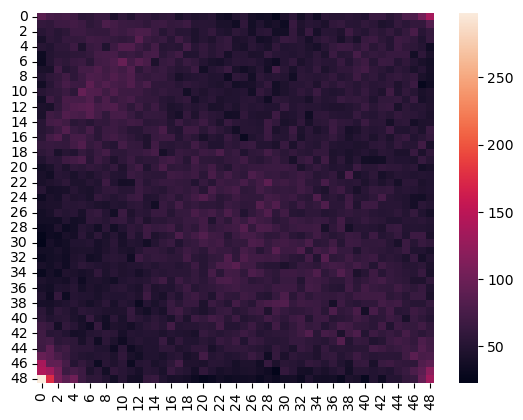

In [40]:
sns.heatmap(rank_overlap_matrix(exp_df.dropna().rank(axis=1), up_df.dropna().rank(axis=1)))

In [41]:
# pd.qcut(exp_df.dropna().rank(axis=1), 10)


def qcut_rows(df, N):
    return df.apply(
        lambda row: pd.qcut(
            row,
            q=N,
            labels=False,
            duplicates="drop"
        ) + 1,
        axis=1
    )

qcut_rows(exp_df.rank(axis=1), 10)

,Ovary,Brain-Cerebellum,Esophagus-GastroesophagealJunction,Artery-Tibial,Cells-Culturedfibroblasts,Testis,Adipose-Subcutaneous,Brain-Substantianigra,Muscle-Skeletal,Lung,...,Artery-Coronary,Thyroid,Brain-CerebellarHemisphere,Colon-Transverse,Colon-Sigmoid,Vagina,Prostate,Brain-Spinalcord_cervicalc-1,Brain-Anteriorcingulatecortex_BA24,Breast-MammaryTissue
gene,,,,,,,,,,,,,,,,,,,,,
ENSG00000000419,10.0,4.0,6.0,9.0,10.0,10.0,8.0,1.0,4.0,7.0,...,8.0,9.0,5.0,5.0,7.0,9.0,6.0,3.0,2.0,8.0
ENSG00000000457,10.0,6.0,5.0,7.0,5.0,8.0,8.0,1.0,4.0,6.0,...,6.0,10.0,7.0,7.0,8.0,9.0,9.0,3.0,2.0,9.0
ENSG00000001036,10.0,2.0,6.0,7.0,10.0,3.0,9.0,3.0,1.0,9.0,...,8.0,10.0,3.0,8.0,5.0,7.0,7.0,6.0,1.0,9.0
ENSG00000001460,8.0,10.0,4.0,1.0,6.0,10.0,3.0,5.0,1.0,7.0,...,2.0,9.0,10.0,7.0,6.0,8.0,8.0,8.0,5.0,6.0
ENSG00000001497,10.0,10.0,9.0,8.0,5.0,10.0,7.0,5.0,1.0,4.0,...,6.0,8.0,10.0,3.0,9.0,7.0,8.0,8.0,4.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000278540,6.0,10.0,8.0,5.0,9.0,9.0,5.0,2.0,1.0,7.0,...,4.0,4.0,10.0,3.0,7.0,8.0,10.0,8.0,7.0,5.0
ENSG00000278685,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ENSG00000280670,9.0,9.0,2.0,3.0,4.0,10.0,2.0,10.0,1.0,5.0,...,3.0,9.0,9.0,3.0,4.0,5.0,6.0,10.0,7.0,3.0


In [42]:
up_df.rank(axis=1)

,Ovary,Brain-Cerebellum,Esophagus-GastroesophagealJunction,Artery-Tibial,Cells-Culturedfibroblasts,Testis,Adipose-Subcutaneous,Brain-Substantianigra,Muscle-Skeletal,Lung,...,Artery-Coronary,Thyroid,Brain-CerebellarHemisphere,Colon-Transverse,Colon-Sigmoid,Vagina,Prostate,Brain-Spinalcord_cervicalc-1,Brain-Anteriorcingulatecortex_BA24,Breast-MammaryTissue
gene,,,,,,,,,,,,,,,,,,,,,
ENSG00000000419,44.0,48.0,19.0,22.0,1.0,47.0,16.0,42.0,17.0,29.0,...,10.0,21.0,49.0,11.0,27.0,32.0,33.0,45.0,31.0,23.0
ENSG00000000457,48.0,47.0,16.0,38.0,3.0,49.0,21.0,19.0,1.0,28.0,...,23.0,35.0,45.0,8.0,22.0,40.0,34.0,33.0,27.0,26.0
ENSG00000001036,29.0,48.0,32.0,25.0,4.0,2.0,3.0,41.0,38.0,28.0,...,31.0,14.0,49.0,21.0,34.0,27.0,26.0,16.0,45.0,7.0
ENSG00000001460,9.0,39.0,24.0,4.0,13.0,35.0,11.0,43.0,46.0,18.0,...,17.0,12.0,41.0,15.0,25.0,19.0,22.0,44.0,34.0,10.0
ENSG00000001497,32.0,49.0,39.0,19.0,2.0,28.0,18.0,22.0,41.0,8.0,...,13.0,23.0,48.0,26.0,34.0,24.0,35.0,11.0,43.0,17.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000278540,38.0,47.0,4.0,3.0,12.0,5.0,7.0,31.0,37.0,20.0,...,25.0,43.0,45.0,22.0,18.0,27.0,36.0,21.0,1.0,11.0
ENSG00000278685,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ENSG00000280670,34.0,39.0,25.0,15.0,12.0,29.0,6.0,49.0,33.0,16.0,...,21.0,26.0,46.0,14.0,32.0,23.0,27.0,45.0,38.0,11.0


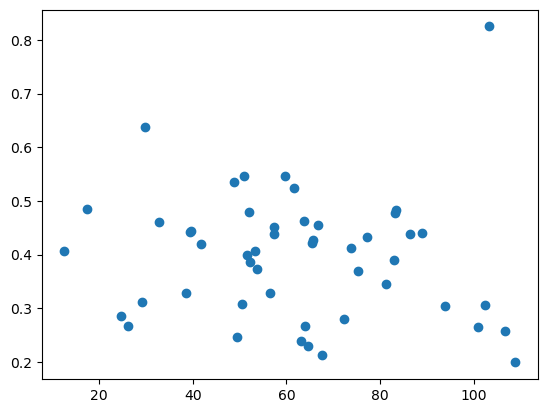

In [43]:
plt.scatter(exp_df.iloc[65], up_df.iloc[65])#.rank(axis=1)

In [44]:
exp_df.rank(axis=1)

,Ovary,Brain-Cerebellum,Esophagus-GastroesophagealJunction,Artery-Tibial,Cells-Culturedfibroblasts,Testis,Adipose-Subcutaneous,Brain-Substantianigra,Muscle-Skeletal,Lung,...,Artery-Coronary,Thyroid,Brain-CerebellarHemisphere,Colon-Transverse,Colon-Sigmoid,Vagina,Prostate,Brain-Spinalcord_cervicalc-1,Brain-Anteriorcingulatecortex_BA24,Breast-MammaryTissue
gene,,,,,,,,,,,,,,,,,,,,,
ENSG00000000419,45.0,18.0,28.0,43.0,48.0,47.0,36.0,5.0,19.0,33.0,...,39.0,41.0,23.0,21.0,31.0,40.0,29.0,14.0,7.0,37.0
ENSG00000000457,45.0,27.0,25.0,33.0,22.0,38.0,37.0,4.0,17.0,29.0,...,28.0,48.0,34.0,30.0,36.0,43.0,41.0,14.0,8.0,40.0
ENSG00000001036,47.0,8.0,29.0,31.0,49.0,14.0,43.0,15.0,1.0,44.0,...,38.0,45.0,11.0,36.0,23.0,34.0,30.0,28.0,2.0,41.0
ENSG00000001460,35.0,44.0,19.0,5.0,25.0,46.0,12.0,21.0,1.0,31.0,...,9.0,38.0,45.0,29.0,24.0,34.0,36.0,37.0,23.0,28.0
ENSG00000001497,45.0,49.0,40.0,37.0,22.0,47.0,32.0,21.0,5.0,20.0,...,29.0,36.0,48.0,14.0,42.0,33.0,35.0,38.0,16.0,30.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000278540,28.0,46.0,37.0,24.0,39.0,41.0,20.0,10.0,5.0,30.0,...,18.0,17.0,47.0,12.0,31.0,34.0,48.0,36.0,33.0,22.0
ENSG00000278685,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ENSG00000280670,41.0,44.0,9.0,13.0,20.0,47.0,10.0,49.0,2.0,22.0,...,14.0,40.0,43.0,12.0,17.0,23.0,29.0,48.0,31.0,15.0


In [45]:
import numpy as np

def rank_overlap_matrix(A, B):
    """
    A, B: arrays of shape (R, N) with ranks 1..N per row, possibly containing NaNs
    Returns: (N, N) overlap matrix
    """
    A = np.asarray(A)
    B = np.asarray(B)

    # Mask valid entries (both A and B observed)
    mask = ~np.isnan(A) & ~np.isnan(B)

    # Convert to 0-based ranks
    A0 = A[mask].astype(int) - 1
    B0 = B[mask].astype(int) - 1

    N = int(np.nanmax([A, B]))

    M = np.zeros((N, N), dtype=int)
    np.add.at(M, (A0, B0), 1)

    return M


In [46]:
up_df.rank(axis=1)

,Ovary,Brain-Cerebellum,Esophagus-GastroesophagealJunction,Artery-Tibial,Cells-Culturedfibroblasts,Testis,Adipose-Subcutaneous,Brain-Substantianigra,Muscle-Skeletal,Lung,...,Artery-Coronary,Thyroid,Brain-CerebellarHemisphere,Colon-Transverse,Colon-Sigmoid,Vagina,Prostate,Brain-Spinalcord_cervicalc-1,Brain-Anteriorcingulatecortex_BA24,Breast-MammaryTissue
gene,,,,,,,,,,,,,,,,,,,,,
ENSG00000000419,44.0,48.0,19.0,22.0,1.0,47.0,16.0,42.0,17.0,29.0,...,10.0,21.0,49.0,11.0,27.0,32.0,33.0,45.0,31.0,23.0
ENSG00000000457,48.0,47.0,16.0,38.0,3.0,49.0,21.0,19.0,1.0,28.0,...,23.0,35.0,45.0,8.0,22.0,40.0,34.0,33.0,27.0,26.0
ENSG00000001036,29.0,48.0,32.0,25.0,4.0,2.0,3.0,41.0,38.0,28.0,...,31.0,14.0,49.0,21.0,34.0,27.0,26.0,16.0,45.0,7.0
ENSG00000001460,9.0,39.0,24.0,4.0,13.0,35.0,11.0,43.0,46.0,18.0,...,17.0,12.0,41.0,15.0,25.0,19.0,22.0,44.0,34.0,10.0
ENSG00000001497,32.0,49.0,39.0,19.0,2.0,28.0,18.0,22.0,41.0,8.0,...,13.0,23.0,48.0,26.0,34.0,24.0,35.0,11.0,43.0,17.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000278540,38.0,47.0,4.0,3.0,12.0,5.0,7.0,31.0,37.0,20.0,...,25.0,43.0,45.0,22.0,18.0,27.0,36.0,21.0,1.0,11.0
ENSG00000278685,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ENSG00000280670,34.0,39.0,25.0,15.0,12.0,29.0,6.0,49.0,33.0,16.0,...,21.0,26.0,46.0,14.0,32.0,23.0,27.0,45.0,38.0,11.0


In [47]:
exp_df.rank(axis=1)

,Ovary,Brain-Cerebellum,Esophagus-GastroesophagealJunction,Artery-Tibial,Cells-Culturedfibroblasts,Testis,Adipose-Subcutaneous,Brain-Substantianigra,Muscle-Skeletal,Lung,...,Artery-Coronary,Thyroid,Brain-CerebellarHemisphere,Colon-Transverse,Colon-Sigmoid,Vagina,Prostate,Brain-Spinalcord_cervicalc-1,Brain-Anteriorcingulatecortex_BA24,Breast-MammaryTissue
gene,,,,,,,,,,,,,,,,,,,,,
ENSG00000000419,45.0,18.0,28.0,43.0,48.0,47.0,36.0,5.0,19.0,33.0,...,39.0,41.0,23.0,21.0,31.0,40.0,29.0,14.0,7.0,37.0
ENSG00000000457,45.0,27.0,25.0,33.0,22.0,38.0,37.0,4.0,17.0,29.0,...,28.0,48.0,34.0,30.0,36.0,43.0,41.0,14.0,8.0,40.0
ENSG00000001036,47.0,8.0,29.0,31.0,49.0,14.0,43.0,15.0,1.0,44.0,...,38.0,45.0,11.0,36.0,23.0,34.0,30.0,28.0,2.0,41.0
ENSG00000001460,35.0,44.0,19.0,5.0,25.0,46.0,12.0,21.0,1.0,31.0,...,9.0,38.0,45.0,29.0,24.0,34.0,36.0,37.0,23.0,28.0
ENSG00000001497,45.0,49.0,40.0,37.0,22.0,47.0,32.0,21.0,5.0,20.0,...,29.0,36.0,48.0,14.0,42.0,33.0,35.0,38.0,16.0,30.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000278540,28.0,46.0,37.0,24.0,39.0,41.0,20.0,10.0,5.0,30.0,...,18.0,17.0,47.0,12.0,31.0,34.0,48.0,36.0,33.0,22.0
ENSG00000278685,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ENSG00000280670,41.0,44.0,9.0,13.0,20.0,47.0,10.0,49.0,2.0,22.0,...,14.0,40.0,43.0,12.0,17.0,23.0,29.0,48.0,31.0,15.0


In [48]:
tissue_up_df.max()

Breast-MammaryTissue    94.446401
dtype: float64

In [49]:
len(tissues)

49

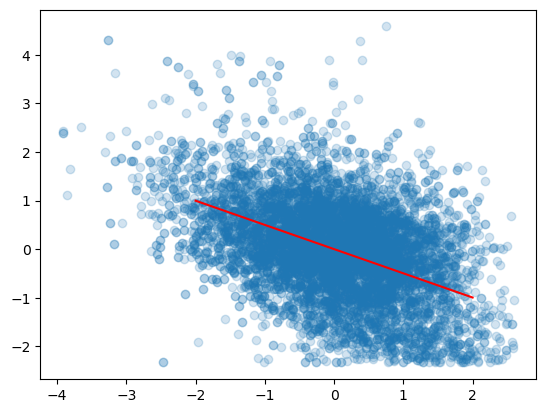

In [50]:
plt.scatter( scale(bc_splicing_expression.logUP),scale(np.log1p(bc_splicing_expression.expression)), 
            alpha=0.2)

plt.plot(  [-2, 2], np.array([-2, 2])*-0.49801205633593,c='red')

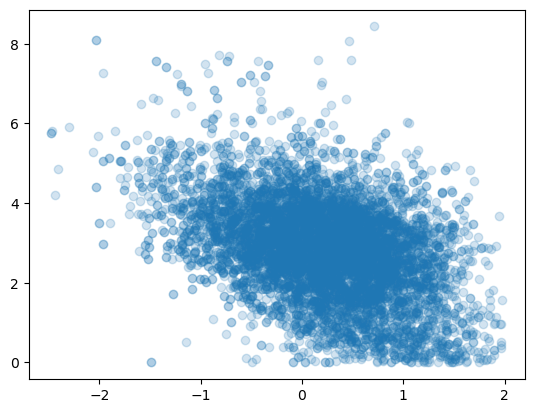

In [51]:
plt.scatter(bc_splicing_expression.logUP, 
            np.log1p(bc_splicing_expression.expression), 
            alpha=0.2)



In [52]:
pearsonr(np.log1p(splicing_expression.expression), 
            splicing_expression.logUP)

PearsonRResult(statistic=np.float64(-0.30264865180067263), pvalue=np.float64(2.494439110548836e-177))

In [53]:
pearsonr(np.log1p(bc_splicing_expression.expression), 
            bc_splicing_expression.logUP)

PearsonRResult(statistic=np.float64(-0.429517519802323), pvalue=np.float64(0.0))

In [55]:
# plot_cumulative_ax(bc_splicing_expression)

In [57]:
# plot_cumulative_ax(splicing_expression)

In [58]:
def getCumulativePlots(splicing_expression, plot_by = 'logUP'):
    q2 = splicing_expression.expression.quantile(0.2)
    q4 = splicing_expression.expression.quantile(0.4)
    q6 = splicing_expression.expression.quantile(0.6)
    q8 = splicing_expression.expression.quantile(0.8)
    
    q1_genes = list(splicing_expression.loc[splicing_expression.expression <= q2].gene)
    q2_genes = list(splicing_expression.loc[(splicing_expression.expression <= q4) & (splicing_expression.expression > q2)].gene)
    q3_genes = list(splicing_expression.loc[(splicing_expression.expression <= q6) & (splicing_expression.expression > q4)].gene)
    q4_genes = list(splicing_expression.loc[(splicing_expression.expression <= q8) & (splicing_expression.expression > q6)].gene)
    q5_genes = list(splicing_expression.loc[splicing_expression.expression > q8].gene)

    xy_q1 = plot_cumulative(splicing_expression.loc[splicing_expression.ensembl_id.isin(q1_genes), plot_by])
    xy_q2 = plot_cumulative(splicing_expression.loc[splicing_expression.ensembl_id.isin(q2_genes), plot_by])
    xy_q3 = plot_cumulative(splicing_expression.loc[splicing_expression.ensembl_id.isin(q3_genes), plot_by])
    xy_q4 = plot_cumulative(splicing_expression.loc[splicing_expression.ensembl_id.isin(q4_genes), plot_by])
    xy_q5 = plot_cumulative(splicing_expression.loc[splicing_expression.ensembl_id.isin(q5_genes), plot_by])

    return xy_q1, xy_q2, xy_q3, xy_q4, xy_q5

In [59]:
def plot_cumulative_ax(splicing_expression, color = 'tab:blue', ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(3,3))

    xy_q1, xy_q2, xy_q3, xy_q4, xy_q5 = getCumulativePlots(splicing_expression)

    colores = palette = sns.light_palette(color, n_colors=5)
    ax.plot(xy_q1[0], xy_q1[1], c = colores[0], linewidth=4)
    ax.plot(xy_q2[0], xy_q2[1], c = colores[1], linewidth=4)
    ax.plot(xy_q3[0], xy_q3[1], c = colores[2], linewidth=4)
    ax.plot(xy_q4[0], xy_q4[1], c = colores[3], linewidth=4)
    ax.plot(xy_q5[0], xy_q5[1], c = colores[4], linewidth=4)
    ax.set_xlim([-2.1, 2.1])

    pear = pearsonr(np.log1p(splicing_expression.expression), splicing_expression.logUP)

    slope = f"{pear[0]:.2f}"

    if pear[1] < 0.001:
        pval = "***"
    elif pear[1] < 0.01:
        pval = "**"
    elif pear[1] < 0.05:
        pval = "*"
    else:
        pval = ""
    
        
    ax.text(np.quantile(ax.get_xlim(), 0.05), np.quantile(ax.get_ylim(), 0.9), r'n=' + str(len(splicing_expression)), fontsize=12)
    ax.text(np.quantile(ax.get_xlim(), 0.05), np.quantile(ax.get_ylim(), 0.8), r'$\rho=$' + slope + pval, fontsize=12)



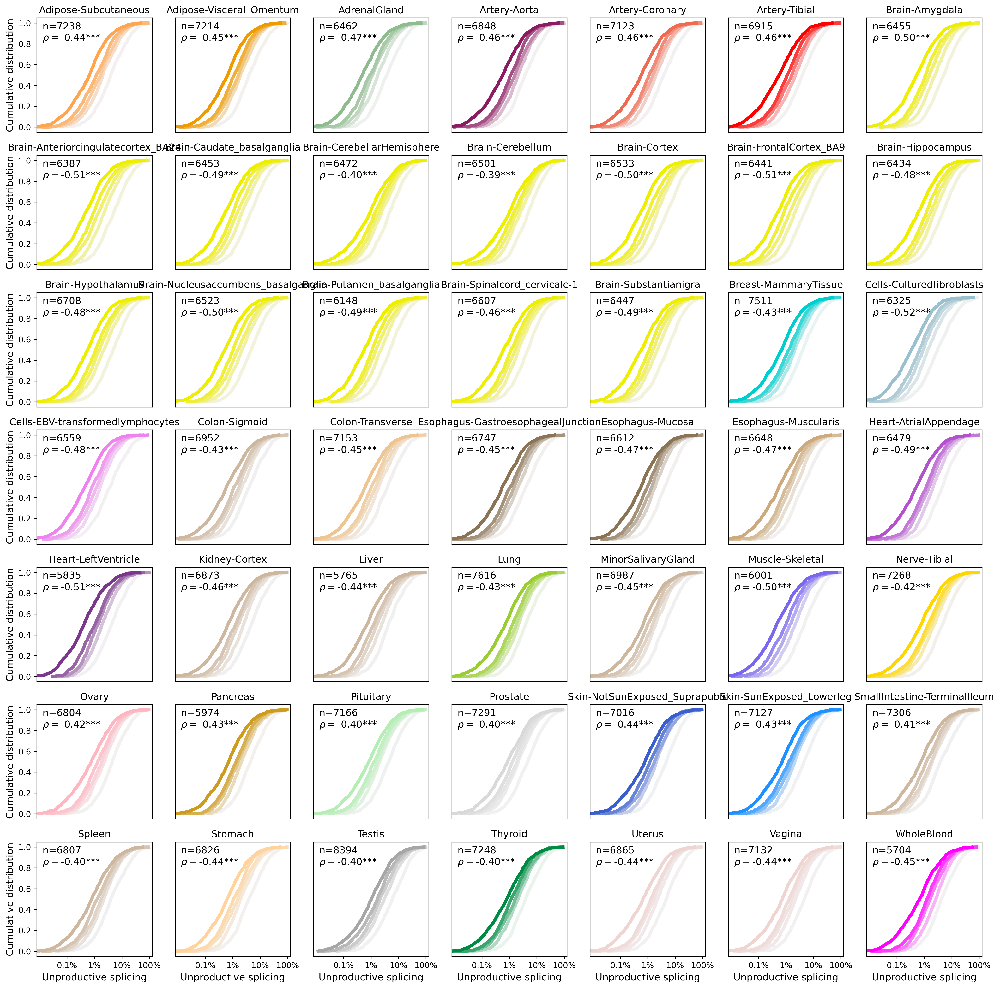

In [60]:
fig, ax = plt.subplots(7, 7, figsize=(21, 21), dpi=300)
i = 0
j = 0

for tissue in sorted(tissues):

    up_table, splicing_expression = process_tissue_pair(tissue, tissue, median_expression)

    plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[i,j])
    
    # ax[i, j].scatter(df.logUPF3A, df.pct, edgecolor = '#' + gtex_colors[tissue]['tissue_color_hex'], s=10, alpha=0.75, 
    #                  facecolor='none', rasterized=True)
    
    if j == 0:
        ax[i,j].set_ylabel('Cumulative distribution', size=12)
    else:
        ax[i,j].set_yticks([])
    
    
        
    if (i == 6):
        ax[i,j].set_xlabel('Unproductive splicing', size=12)
        ax[i,j].set_xticks([-1, 0, 1, 2], ['0.1%', '1%', '10%', '100%'])
    else:
        ax[i,j].set_xticks([])  

    ax[i,j].set_title(tissue, size=12)

    j += 1
    if j >= 7:
        j = 0
        i += 1

plt.savefig('revision_plots/UP_splicing_by_exppression.All.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.All.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.All.svg', dpi=300, bbox_inches='tight')    

In [62]:
tissue_rho_df = []
tissue_pval_df = []
for tissue1 in tqdm(sorted(tissues)):
    tissue_rho_row = []
    tissue_pval_row = []
    for tissue2 in sorted(tissues):
        
        up_table, splicing_expression = process_tissue_pair(tissue1, tissue2, median_expression)
        pear = pearsonr(np.log1p(splicing_expression.expression), splicing_expression.logUP)
        tissue_rho_row.append(pear[0])
        tissue_pval_row.append(pear[1])

    tissue_rho_df.append(tissue_rho_row)
    tissue_pval_df.append(tissue_pval_row)

rho_df = pd.DataFrame(tissue_rho_df)
rho_df.columns = sorted(tissues)
rho_df.index = sorted(tissues)

100%|██████████| 49/49 [10:17<00:00, 12.60s/it]


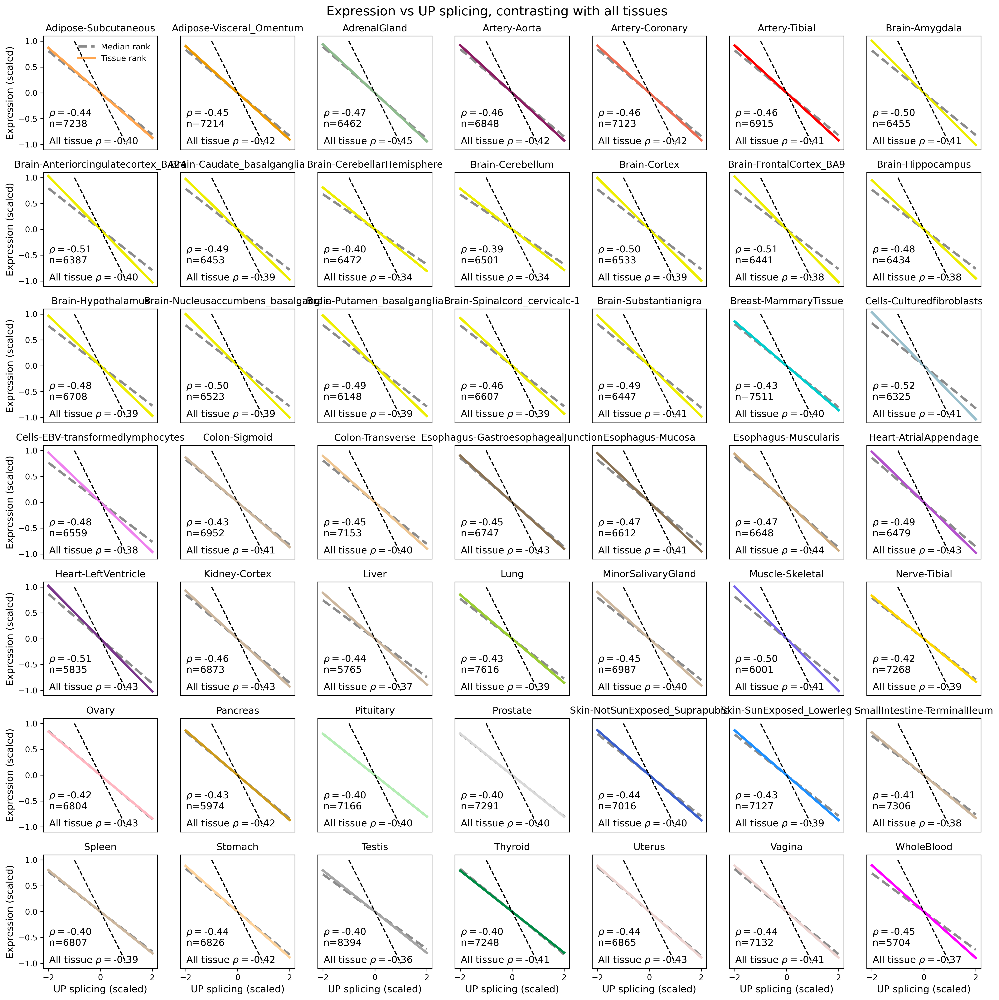

In [63]:
fig, ax = plt.subplots(7, 7, figsize=(21, 21), dpi=300)
i = 0
j = 0

for tissue in sorted(tissues):

    up_table, splicing_expression = process_tissue_pair(tissue, tissue, median_expression, tissues)

    rho_all = pearsonr(splicing_expression.logUP, np.log1p(splicing_expression.expression))[0]

    if (i == 0) and (j == 0):
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho_all,c='grey', linewidth=3, alpha=0.9, linestyle='--', label = 'Median rank')
    else:
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho_all,c='grey', linewidth=3, alpha=0.9, linestyle='--')

    # for tissue2 in [x for x in sorted(tissues) if x != tissue]:
    #     rho = rho_df.loc[tissue, tissue2]
    #     color_t2 = '#' + gtex_colors[tissue2]['tissue_color_hex']

    #     ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color_t2, linewidth=1, alpha=0.25)

    color = '#' + gtex_colors[tissue]['tissue_color_hex']
    rho = rho_df.loc[tissue, tissue]
    if (i == 0) and (j == 0):
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color, linewidth=3, alpha=1, label='Tissue rank')
        ax[i,j].legend(frameon=False)
    else:
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color, linewidth=3, alpha=1)
        

    
    
    if j == 0:
        ax[i,j].set_ylabel('Expression (scaled)', size=12)
    else:
        ax[i,j].set_yticks([])
    
    
        
    if (i == 6):
        ax[i,j].set_xlabel('UP splicing (scaled)', size=12)
        # ax[i,j].set_xticks([-1, 0, 1, 2], ['0.1%', '1%', '10%', '100%'])
    else:
        ax[i,j].set_xticks([])  

    ax[i,j].set_title(tissue, size=12)
    ax[i,j].set_ylim([-1.1, 1.1])

    
    slope = f"{rho:.2f}"
    slope_all = f"{rho_all:.2f}"

    ax[i,j].plot([-1, 1], [1, -1], c= 'black', linestyle = '--')
        
    
    ax[i,j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.2), r'$\rho=$' + slope + f'\nn={splicing_expression.shape[0]}', fontsize=12)
    ax[i,j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.05), 'All tissue ' + r'$\rho=$' + slope_all, fontsize=12)
    

    j += 1
    if j >= 7:
        j = 0
        i += 1

fig.suptitle("Expression vs UP splicing, contrasting with all tissues", fontsize=16, y = 0.905)


plt.savefig('revision_plots/UP_splicing_by_exppression.slopes.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.slopes.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.slopes.svg', dpi=300, bbox_inches='tight')    

In [64]:
def process_tissue_pair_high_variance(tissue1, tissue2, median_expression, method = 'all_tissues'):
    up_table = get_UP_table(tissue1)
    if method == 'tissue2':
        splicing_expression = get_splicing_expression_high_variance(up_table, median_expression, tissue2, method = 'same_tissue')
    else:
        splicing_expression = get_splicing_expression_high_variance(up_table, median_expression, tissue1, method = method)
    return up_table, splicing_expression

def get_splicing_expression_high_variance(up_table, median_expression, tissue1, method = 'all_tissues'):
    
    shared_genes = pd.Index(up_table.ensembl_id).intersection(pd.Index(median_expression.gene))
    tissues = median_expression.columns[2:-1]

    if method in ['all_tissues', 'same_tissue']:
        mexp = median_expression.loc[median_expression.gene.isin(up_table.ensembl_id), tissues]
        exp_quintiles = mexp.apply(lambda col: pd.qcut(col.rank(method='average'), q=5, labels=[1, 2, 3, 4, 5])).astype(int)
        median_expression = median_expression.loc[exp_quintiles.loc[exp_quintiles.max(axis=1) - exp_quintiles.min(axis=1) >= 2].index]

        if method == 'all_tissues':
            med_exp = list(median_expression[tissues].median(axis=1))
        elif method == 'same_tissue':
            med_exp = list(median_expression[tissue1])

    elif method in ['tissue_diff', 'other_diff']:
        other_tissues = [x for x in tissues if x != tissue1]

        other_median = median_expression.loc[median_expression.gene.isin(up_table.ensembl_id), other_tissues].median(axis=1)

        other_median_rank = pd.qcut(other_median.rank(method='average'), q=5, labels = [1, 2, 3, 4, 5]).astype(int)
        tissue_median_rank = pd.qcut(median_expression.loc[median_expression.gene.isin(up_table.ensembl_id), tissue1].rank(method='average'), 
                                     q=5, labels = [1, 2, 3, 4, 5]).astype(int)

        median_expression = median_expression.loc[other_median_rank.loc[(other_median_rank - tissue_median_rank).abs() >= 2].index]

        if method == 'other_diff':
            med_exp = list(median_expression[tissues].median(axis=1))
        elif method == 'tissue_diff':
            med_exp = list(median_expression[tissue1])

    bc_median = pd.DataFrame({'gene':list(median_expression.gene), 'expression':med_exp})
    bc_median = bc_median.loc[bc_median.gene.isin(shared_genes)]

    bc_splicing_expression = up_table.merge(bc_median, left_on = 'ensembl_id', right_on = 'gene').dropna()
    
    bc_splicing_expression['logUP'] = np.log10(np.maximum(0.001, bc_splicing_expression.UP_percentage))
    bc_splicing_expression['lognonPR'] = np.log10(np.maximum(0.001, bc_splicing_expression.nonPR_percentage))

    return bc_splicing_expression

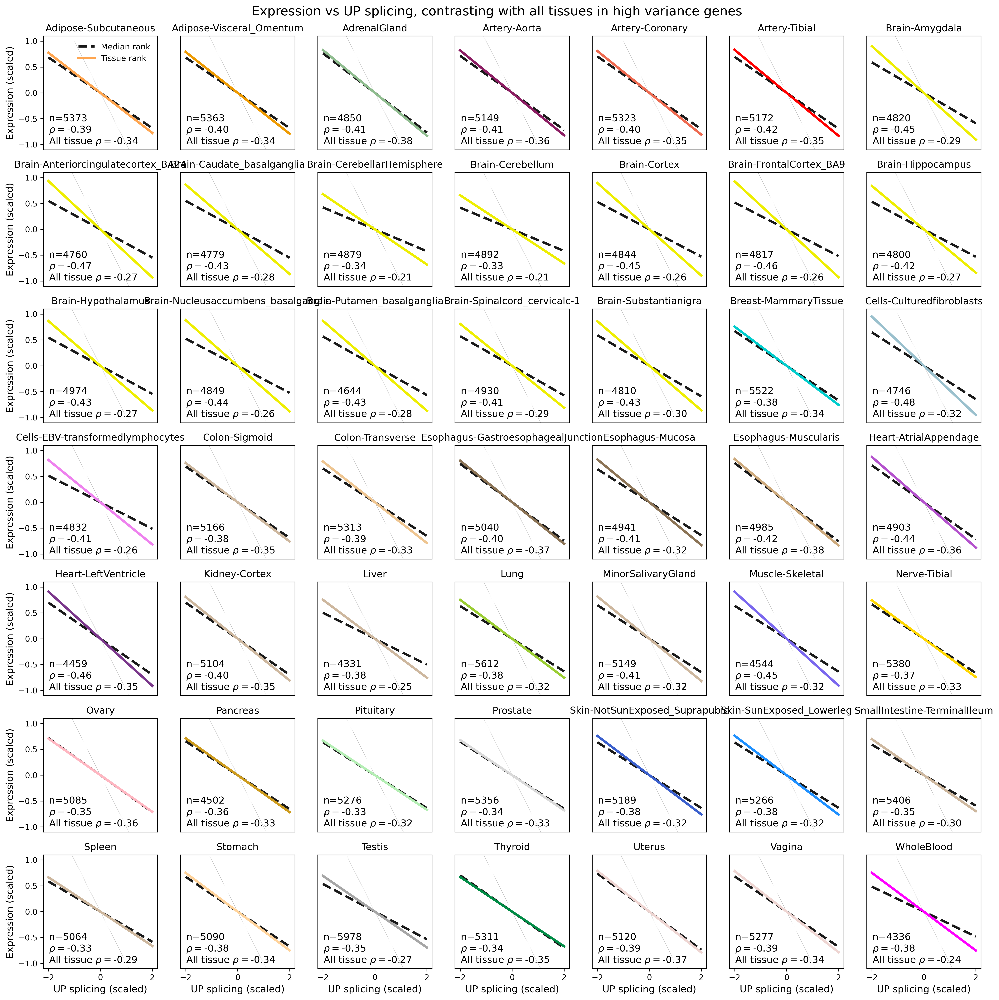

In [65]:
fig, ax = plt.subplots(7, 7, figsize=(21, 21), dpi=300)
i = 0
j = 0

for tissue in sorted(tissues):

    ax[i,j].plot([-2, 2], [2, -2], c= 'grey', linestyle = '--', linewidth = 0.5, alpha = 0.5)

    up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'all_tissues')

    rho_all = pearsonr(splicing_expression.logUP, np.log1p(splicing_expression.expression))[0]

    if (i == 0) and (j == 0):
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho_all,c='black', linewidth=3, alpha=0.9, linestyle='--', label = 'Median rank')
    else:
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho_all,c='black', linewidth=3, alpha=0.9, linestyle='--')

    # for tissue2 in [x for x in sorted(tissues) if x != tissue]:
    #     rho = rho_df.loc[tissue, tissue2]
    #     color_t2 = '#' + gtex_colors[tissue2]['tissue_color_hex']

    #     ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color_t2, linewidth=1, alpha=0.25)

    color = '#' + gtex_colors[tissue]['tissue_color_hex']

    up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'same_tissue')
    rho = pearsonr(splicing_expression.logUP, np.log1p(splicing_expression.expression))[0]
    # rho = rho_df.loc[tissue, tissue]
    if (i == 0) and (j == 0):
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color, linewidth=3, alpha=1, label='Tissue rank')
        ax[i,j].legend(frameon=False)
    else:
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color, linewidth=3, alpha=1)
        

    
    
    if j == 0:
        ax[i,j].set_ylabel('Expression (scaled)', size=12)
    else:
        ax[i,j].set_yticks([])
    
    
        
    if (i == 6):
        ax[i,j].set_xlabel('UP splicing (scaled)', size=12)
        # ax[i,j].set_xticks([-1, 0, 1, 2], ['0.1%', '1%', '10%', '100%'])
    else:
        ax[i,j].set_xticks([])  

    ax[i,j].set_title(tissue, size=12)
    ax[i,j].set_ylim([-1.1, 1.1])
    
    N = str(splicing_expression.shape[0])
    
    slope = f"{rho:.2f}"
    slope_all = f"{rho_all:.2f}"

    
        
    ax[i,j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.25), 'n=' + N, fontsize=12)    
    ax[i,j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.15), r'$\rho=$' + slope, fontsize=12)
    ax[i,j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.05), 'All tissue ' + r'$\rho=$' + slope_all, fontsize=12)
    

    j += 1
    if j >= 7:
        j = 0
        i += 1

fig.suptitle("Expression vs UP splicing, contrasting with all tissues in high variance genes", fontsize=16, y = 0.905)


plt.savefig('revision_plots/UP_splicing_by_exppression.slopes_high_variance.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.slopes_high_variance.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.slopes_high_variance.svg', dpi=300, bbox_inches='tight')      

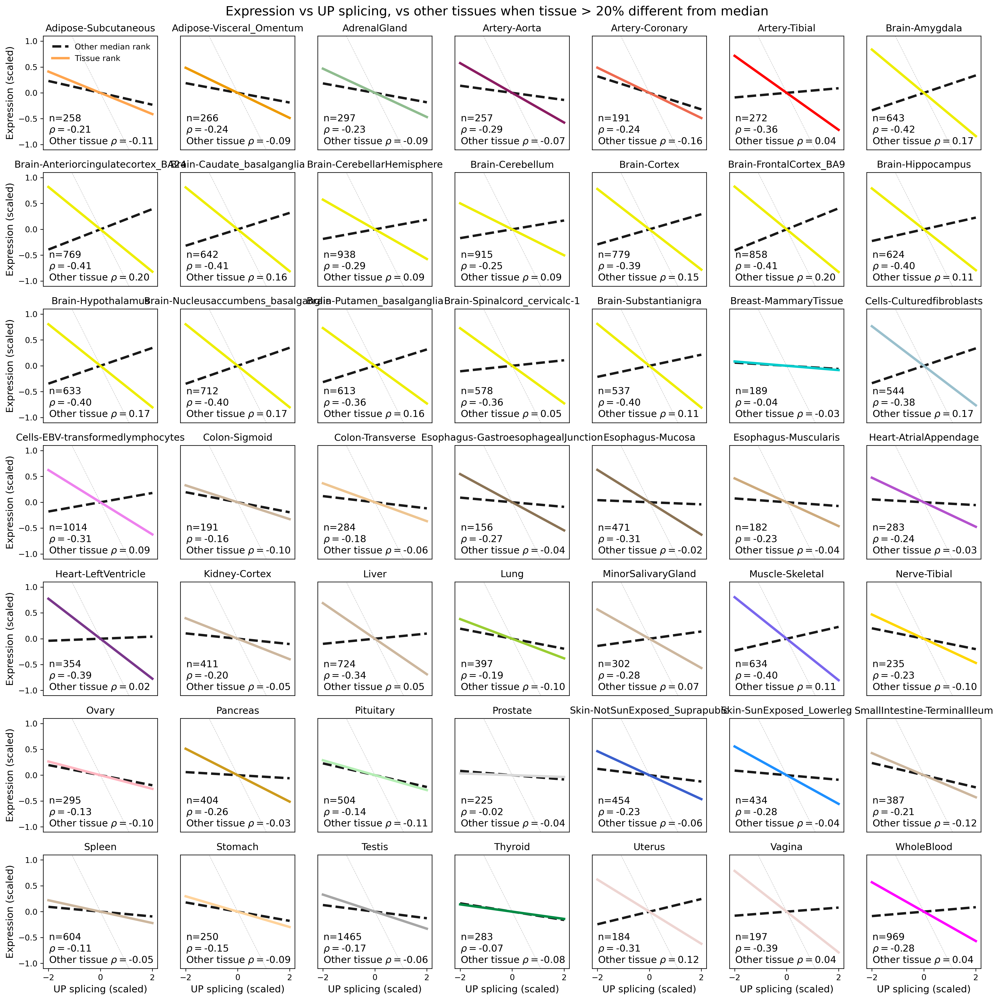

In [66]:
fig, ax = plt.subplots(7, 7, figsize=(21, 21), dpi=300)
i = 0
j = 0

for tissue in sorted(tissues):

    ax[i,j].plot([-2, 2], [2, -2], c= 'grey', linestyle = '--', linewidth = 0.5, alpha = 0.5)

    up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'other_diff')

    rho_all = pearsonr(splicing_expression.logUP, np.log1p(splicing_expression.expression))[0]

    if (i == 0) and (j == 0):
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho_all,c='black', linewidth=3, alpha=0.9, linestyle='--', label = 'Other median rank')
    else:
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho_all,c='black', linewidth=3, alpha=0.9, linestyle='--')

    # for tissue2 in [x for x in sorted(tissues) if x != tissue]:
    #     rho = rho_df.loc[tissue, tissue2]
    #     color_t2 = '#' + gtex_colors[tissue2]['tissue_color_hex']

    #     ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color_t2, linewidth=1, alpha=0.25)

    color = '#' + gtex_colors[tissue]['tissue_color_hex']

    up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'tissue_diff')
    rho = pearsonr(splicing_expression.logUP, np.log1p(splicing_expression.expression))[0]
    # rho = rho_df.loc[tissue, tissue]
    if (i == 0) and (j == 0):
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color, linewidth=3, alpha=1, label='Tissue rank')
        ax[i,j].legend(frameon=False)
    else:
        ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color, linewidth=3, alpha=1)
        

    
    
    if j == 0:
        ax[i,j].set_ylabel('Expression (scaled)', size=12)
    else:
        ax[i,j].set_yticks([])
    
    
        
    if (i == 6):
        ax[i,j].set_xlabel('UP splicing (scaled)', size=12)
        # ax[i,j].set_xticks([-1, 0, 1, 2], ['0.1%', '1%', '10%', '100%'])
    else:
        ax[i,j].set_xticks([])  

    ax[i,j].set_title(tissue, size=12)
    ax[i,j].set_ylim([-1.1, 1.1])

    N = str(splicing_expression.shape[0])
    slope = f"{rho:.2f}"
    slope_all = f"{rho_all:.2f}"

    
        
    ax[i,j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.25), 'n=' + N, fontsize=12)    
    ax[i,j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.15), r'$\rho=$' + slope, fontsize=12)
    ax[i,j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.05), 'Other tissue ' + r'$\rho=$' + slope_all, fontsize=12)
    

    j += 1
    if j >= 7:
        j = 0
        i += 1

fig.suptitle("Expression vs UP splicing, vs other tissues when tissue > 20% different from median", fontsize=16, y = 0.905)


plt.savefig('revision_plots/UP_splicing_by_exppression.slopes_high_variance_diff.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.slopes_high_variance_diff.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.slopes_high_variance_diff.svg', dpi=300, bbox_inches='tight')    

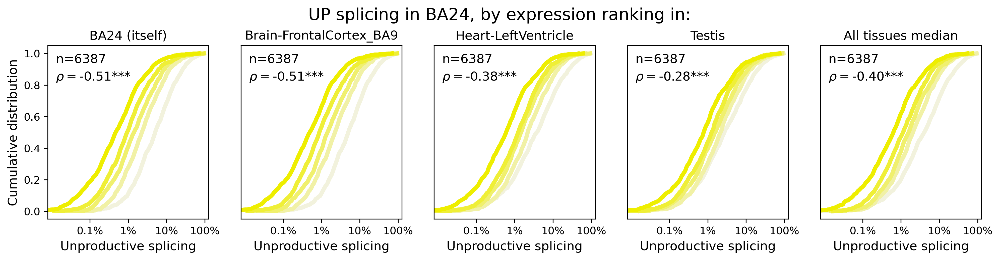

In [67]:
fig, ax = plt.subplots(1, 5, figsize=(16, 3), dpi=300)
i = 0
j = 0
tissue = 'Brain-Anteriorcingulatecortex_BA24'
tissue2_list = ['Brain-Anteriorcingulatecortex_BA24', 'Brain-FrontalCortex_BA9', 'Heart-LeftVentricle', 'Testis']
for i, tissue2 in enumerate(tissue2_list):

    up_table, splicing_expression = process_tissue_pair(tissue, tissue2, median_expression)

    plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[i])
   
    if i == 0:
        ax[i].set_ylabel('Cumulative distribution', size=12)
        ax[i].set_title('BA24 (itself)', size=12)
    else:
        ax[i].set_title(tissue2, size=12)
        ax[i].set_yticks([])
    
    
        
    ax[i].set_xticks([])  

    
    

up_table, splicing_expression = process_tissue_pair(tissue, tissue2, median_expression, tissues_median=tissues)

plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[4])

ax[4].set_yticks([])


    
ax[4].set_xticks([])  

ax[4].set_title('All tissues median', size=12)

for ax_ in ax:
    ax_.set_xlabel('Unproductive splicing', size=12)
    ax_.set_xticks([-1, 0, 1, 2], ['0.1%', '1%', '10%', '100%'])

fig.suptitle("UP splicing in BA24, by expression ranking in:", fontsize=16, y = 1.05)

    # j += 1
    # if j >= 7:
    #     j = 0
    #     i += 1

plt.savefig('revision_plots/UP_splicing_by_exppression.BA24_v_selected.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.BA24_v_selected.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.BA24_v_selected.svg', dpi=300, bbox_inches='tight')    

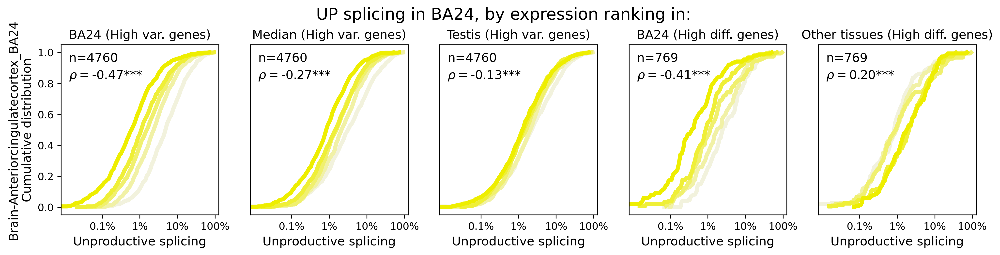

In [68]:
fig, ax = plt.subplots(1, 5, figsize=(16, 3), dpi=300)
i = 0
j = 0
# tissue all, all median, all testis, tissue high var, high var diff
tissue = 'Brain-Anteriorcingulatecortex_BA24'
# tissue2_list = ['Brain-Anteriorcingulatecortex_BA24', 'Brain-FrontalCortex_BA9', 'Heart-LeftVentricle', 'Testis']

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'same_tissue')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[0])
ax[0].set_ylabel(tissue + '\nCumulative distribution', size=12)
ax[0].set_title('BA24 (High var. genes)', size=12)

    


up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'all_tissues')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[1])
ax[1].set_title('Median (High var. genes)', size=12)
ax[1].set_yticks([])

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, 'Testis', median_expression, 'tissue2')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[2])
ax[2].set_title('Testis (High var. genes)', size=12)
ax[2].set_yticks([])



# up_table, splicing_expression = process_tissue_pair(tissue, tissue, median_expression, tissues_median=tissues)



# plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[1])
# ax[1].set_title('Median (all genes)', size=12)
# ax[1].set_yticks([])


# up_table, splicing_expression = process_tissue_pair(tissue, 'Testis', median_expression)
# plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[2])
# ax[2].set_title('Testis (all genes)', size=12)
# ax[2].set_yticks([])

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'tissue_diff')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[3])
ax[3].set_title('BA24 (High diff. genes)', size=12)
ax[3].set_yticks([])
    
up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'other_diff')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[4])
ax[4].set_title('Other tissues (High diff. genes)', size=12)
ax[4].set_yticks([])


for ax_ in ax:
    ax_.set_xlabel('Unproductive splicing', size=12)
    ax_.set_xticks([-1, 0, 1, 2], ['0.1%', '1%', '10%', '100%'])

fig.suptitle("UP splicing in BA24, by expression ranking in:", fontsize=16, y = 1.05)

    # j += 1
    # if j >= 7:
    #     j = 0
    #     i += 1

plt.savefig('revision_plots/UP_splicing_by_exppression.BA24_v_selected_high_var.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.BA24_v_selected_high_var.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.BA24_v_selected_high_var.svg', dpi=300, bbox_inches='tight')    

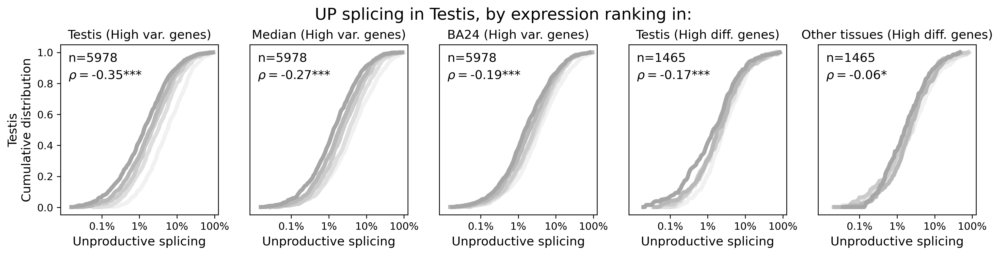

In [69]:
fig, ax = plt.subplots(1, 5, figsize=(16, 3), dpi=300)
i = 0
j = 0
# tissue all, all median, all testis, tissue high var, high var diff
tissue = 'Testis'
# tissue2_list = ['Brain-Anteriorcingulatecortex_BA24', 'Brain-FrontalCortex_BA9', 'Heart-LeftVentricle', 'Testis']

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'same_tissue')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[0])
ax[0].set_ylabel(tissue + '\nCumulative distribution', size=12)
ax[0].set_title('Testis (High var. genes)', size=12)

    


up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'all_tissues')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[1])
ax[1].set_title('Median (High var. genes)', size=12)
ax[1].set_yticks([])

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, 'Brain-Anteriorcingulatecortex_BA24', median_expression, 'tissue2')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[2])
ax[2].set_title('BA24 (High var. genes)', size=12)
ax[2].set_yticks([])



# up_table, splicing_expression = process_tissue_pair(tissue, tissue, median_expression, tissues_median=tissues)



# plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[1])
# ax[1].set_title('Median (all genes)', size=12)
# ax[1].set_yticks([])


# up_table, splicing_expression = process_tissue_pair(tissue, 'Testis', median_expression)
# plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[2])
# ax[2].set_title('Testis (all genes)', size=12)
# ax[2].set_yticks([])

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'tissue_diff')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[3])
ax[3].set_title('Testis (High diff. genes)', size=12)
ax[3].set_yticks([])
    
up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'other_diff')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[4])
ax[4].set_title('Other tissues (High diff. genes)', size=12)
ax[4].set_yticks([])


for ax_ in ax:
    ax_.set_xlabel('Unproductive splicing', size=12)
    ax_.set_xticks([-1, 0, 1, 2], ['0.1%', '1%', '10%', '100%'])

fig.suptitle("UP splicing in Testis, by expression ranking in:", fontsize=16, y = 1.05)

    # j += 1
    # if j >= 7:
    #     j = 0
    #     i += 1
plt.savefig('revision_plots/UP_splicing_by_exppression.Testis_v_selected_high_var.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.Testis_v_selected_high_var.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.Testis_v_selected_high_var.svg', dpi=300, bbox_inches='tight')    

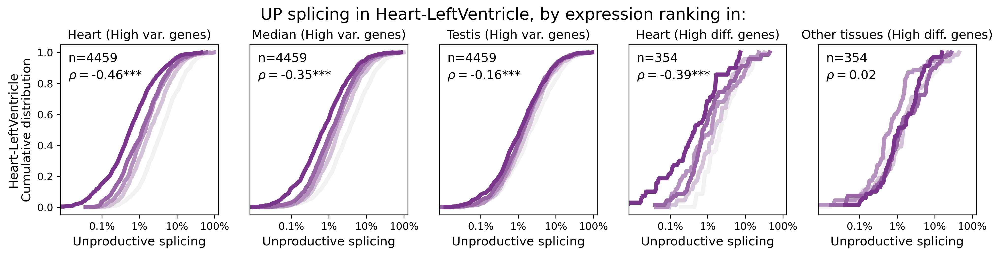

In [70]:
fig, ax = plt.subplots(1, 5, figsize=(16, 3), dpi=300)
i = 0
j = 0
# tissue all, all median, all testis, tissue high var, high var diff
tissue = 'Heart-LeftVentricle'
# tissue2_list = ['Brain-Anteriorcingulatecortex_BA24', 'Brain-FrontalCortex_BA9', 'Heart-LeftVentricle', 'Testis']

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'same_tissue')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[0])
ax[0].set_ylabel(tissue + '\nCumulative distribution', size=12)
ax[0].set_title('Heart (High var. genes)', size=12)

    


up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'all_tissues')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[1])
ax[1].set_title('Median (High var. genes)', size=12)
ax[1].set_yticks([])

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, 'Testis', median_expression, 'tissue2')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[2])
ax[2].set_title('Testis (High var. genes)', size=12)
ax[2].set_yticks([])



# up_table, splicing_expression = process_tissue_pair(tissue, tissue, median_expression, tissues_median=tissues)



# plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[1])
# ax[1].set_title('Median (all genes)', size=12)
# ax[1].set_yticks([])


# up_table, splicing_expression = process_tissue_pair(tissue, 'Testis', median_expression)
# plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[2])
# ax[2].set_title('Testis (all genes)', size=12)
# ax[2].set_yticks([])

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'tissue_diff')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[3])
ax[3].set_title('Heart (High diff. genes)', size=12)
ax[3].set_yticks([])
    
up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'other_diff')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[4])
ax[4].set_title('Other tissues (High diff. genes)', size=12)
ax[4].set_yticks([])


for ax_ in ax:
    ax_.set_xlabel('Unproductive splicing', size=12)
    ax_.set_xticks([-1, 0, 1, 2], ['0.1%', '1%', '10%', '100%'])

fig.suptitle("UP splicing in Heart-LeftVentricle, by expression ranking in:", fontsize=16, y = 1.05)

    # j += 1
    # if j >= 7:
    #     j = 0
    #     i += 1
plt.savefig('revision_plots/UP_splicing_by_exppression.Heart_v_selected_high_var.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.Heart_v_selected_high_var.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.Heart_v_selected_high_var.svg', dpi=300, bbox_inches='tight')   

Text(0.5, 1.05, 'UP splicing in Testis, by expression ranking in:')

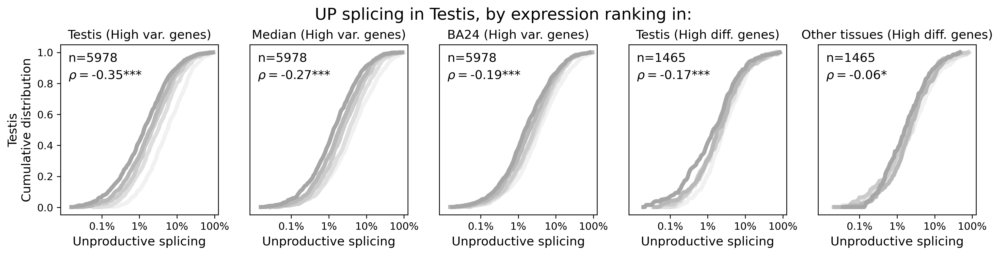

In [71]:
fig, ax = plt.subplots(1, 5, figsize=(16, 3), dpi=300)
i = 0
j = 0
# tissue all, all median, all testis, tissue high var, high var diff
tissue = 'Testis'
# tissue2_list = ['Brain-Anteriorcingulatecortex_BA24', 'Brain-FrontalCortex_BA9', 'Heart-LeftVentricle', 'Testis']

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'same_tissue')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[0])
ax[0].set_ylabel(tissue + '\nCumulative distribution', size=12)
ax[0].set_title('Testis (High var. genes)', size=12)

    


up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'all_tissues')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[1])
ax[1].set_title('Median (High var. genes)', size=12)
ax[1].set_yticks([])

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, 'Brain-Anteriorcingulatecortex_BA24', median_expression, 'tissue2')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[2])
ax[2].set_title('BA24 (High var. genes)', size=12)
ax[2].set_yticks([])



# up_table, splicing_expression = process_tissue_pair(tissue, tissue, median_expression, tissues_median=tissues)



# plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[1])
# ax[1].set_title('Median (all genes)', size=12)
# ax[1].set_yticks([])


# up_table, splicing_expression = process_tissue_pair(tissue, 'Testis', median_expression)
# plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[2])
# ax[2].set_title('Testis (all genes)', size=12)
# ax[2].set_yticks([])

up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'tissue_diff')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[3])
ax[3].set_title('Testis (High diff. genes)', size=12)
ax[3].set_yticks([])
    
up_table, splicing_expression = process_tissue_pair_high_variance(tissue, tissue, median_expression, 'other_diff')
plot_cumulative_ax(splicing_expression, color = '#' + gtex_colors[tissue]['tissue_color_hex'], ax=ax[4])
ax[4].set_title('Other tissues (High diff. genes)', size=12)
ax[4].set_yticks([])


for ax_ in ax:
    ax_.set_xlabel('Unproductive splicing', size=12)
    ax_.set_xticks([-1, 0, 1, 2], ['0.1%', '1%', '10%', '100%'])

fig.suptitle("UP splicing in Testis, by expression ranking in:", fontsize=16, y = 1.05)

    # j += 1
    # if j >= 7:
    #     j = 0
    #     i += 1
# plt.savefig('revision_plots/UP_splicing_by_exppression.BA24_v_selected.png', dpi=300, bbox_inches='tight')
# plt.savefig('revision_plots/UP_splicing_by_exppression.BA24_v_selected.pdf', dpi=300, bbox_inches='tight')
# plt.savefig('revision_plots/UP_splicing_by_exppression.BA24_v_selected.svg', dpi=300, bbox_inches='tight')    

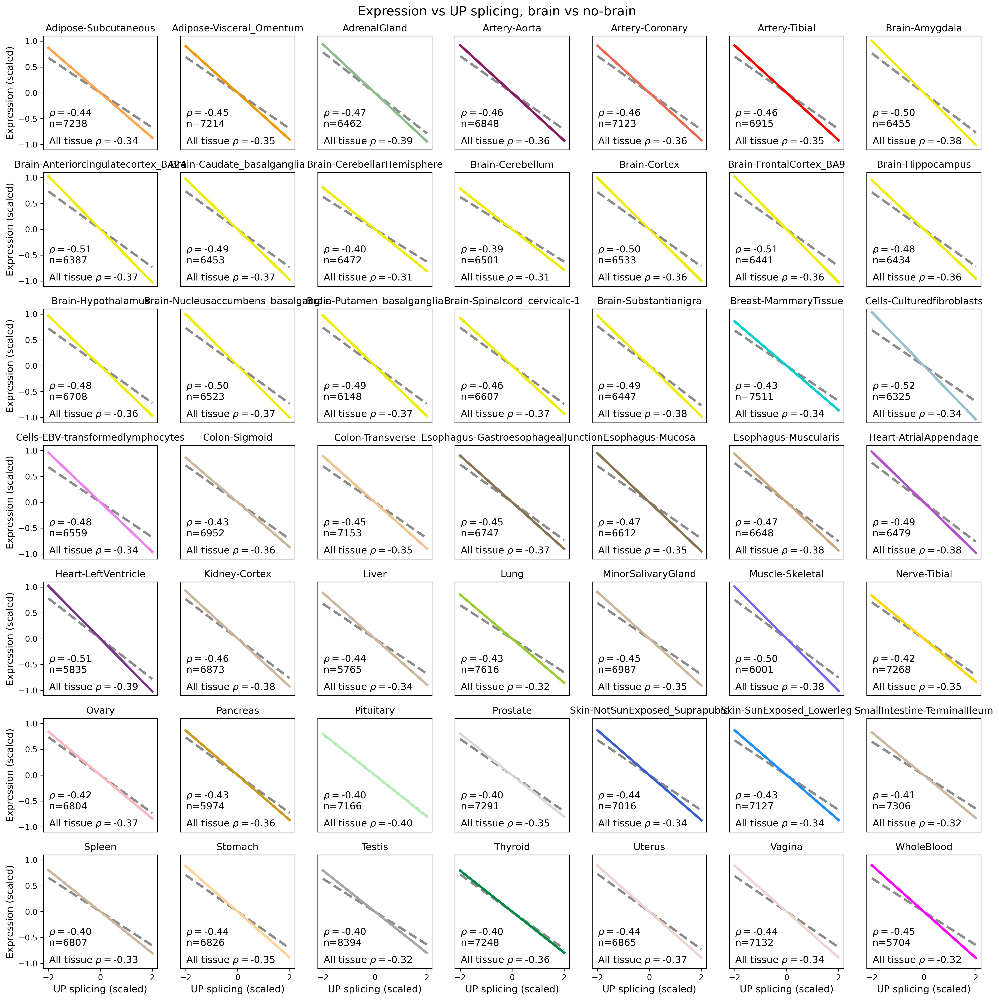

In [72]:
fig, ax = plt.subplots(7, 7, figsize=(21, 21), dpi=300)
i = 0
j = 0

for tissue in sorted(tissues):

    if 'Brain' in tissue:
        tissue_select = [x for x in tissues if 'Brain' not in x]
    else:
        tissue_select = [x for x in tissues if 'Brain' in x]
        
    up_table, splicing_expression = process_tissue_pair(tissue, tissue, median_expression, tissue_select)

    rho_all = pearsonr(splicing_expression.logUP, np.log1p(splicing_expression.expression))[0]
    ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho_all,c='grey', linewidth=3, alpha=0.9, linestyle='--')

    # for tissue2 in [x for x in sorted(tissues) if x != tissue]:
    #     rho = rho_df.loc[tissue, tissue2]
    #     color_t2 = '#' + gtex_colors[tissue2]['tissue_color_hex']

    #     ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color_t2, linewidth=1, alpha=0.25)

    color = '#' + gtex_colors[tissue]['tissue_color_hex']
    rho = rho_df.loc[tissue, tissue]
    ax[i,j].plot(  [-2, 2], np.array([-2, 2])*rho,c=color, linewidth=3, alpha=1)

    
    
    if j == 0:
        ax[i,j].set_ylabel('Expression (scaled)', size=12)
    else:
        ax[i,j].set_yticks([])
    
    
        
    if (i == 6):
        ax[i,j].set_xlabel('UP splicing (scaled)', size=12)
        # ax[i,j].set_xticks([-1, 0, 1, 2], ['0.1%', '1%', '10%', '100%'])
    else:
        ax[i,j].set_xticks([])  

    ax[i,j].set_title(tissue, size=12)
    ax[i,j].set_ylim([-1.1, 1.1])

    
    slope = f"{rho:.2f}"
    slope_all = f"{rho_all:.2f}"

    
        
    
    ax[i,j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.2), r'$\rho=$' + slope + f'\nn={splicing_expression.shape[0]}', fontsize=12)
    ax[i,j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.05), 'All tissue ' + r'$\rho=$' + slope_all, fontsize=12)
    

    j += 1
    if j >= 7:
        j = 0
        i += 1

fig.suptitle("Expression vs UP splicing, brain vs no-brain", fontsize=16, y = 0.905)


plt.savefig('revision_plots/UP_splicing_by_exppression.slopes_category_select.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.slopes_category_select.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.slopes_category_select.svg', dpi=300, bbox_inches='tight')    

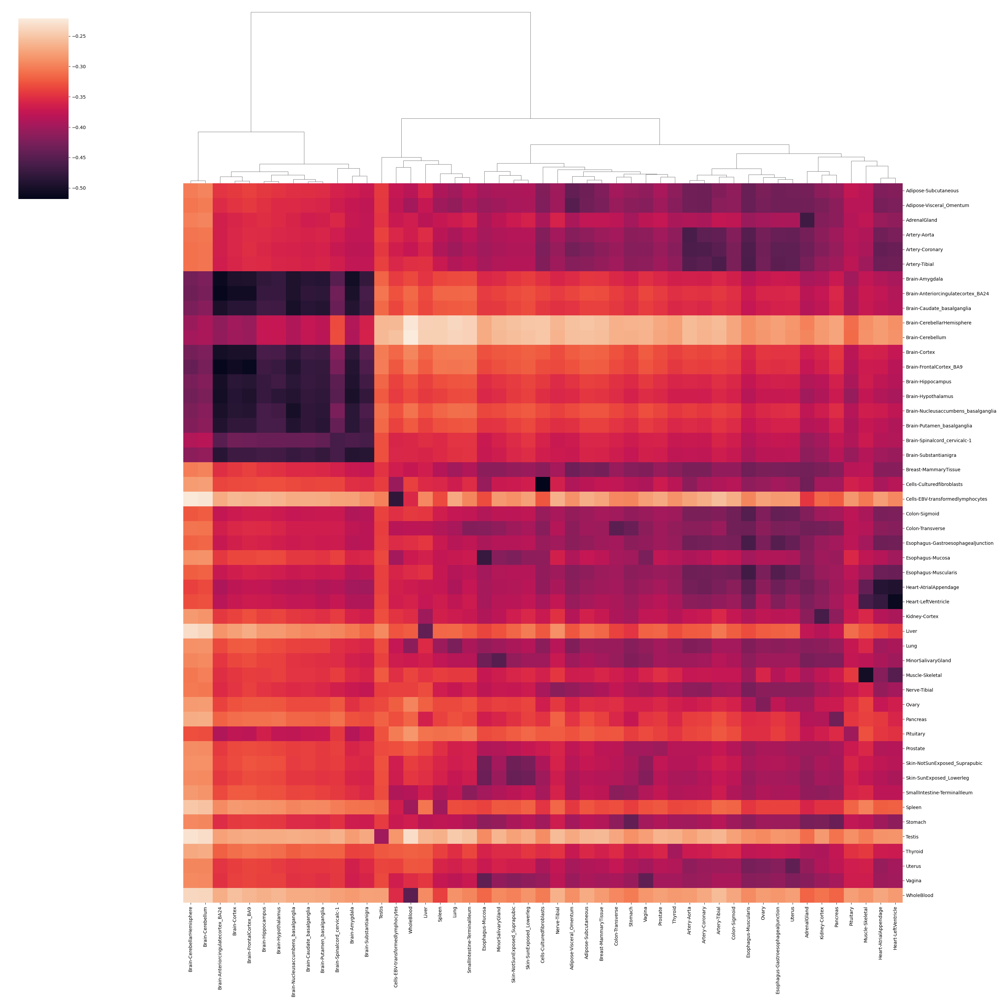

In [73]:
np.random.seed(1)
g = sns.clustermap(rho_df.T, figsize=(30, 30), row_cluster=False, method='ward')
col_order = g.dendrogram_col.reordered_ind


In [74]:
colores = ['#' + gtex_colors[tissue]['tissue_color_hex'] for tissue in rho_df.T.iloc[col_order, col_order].index]

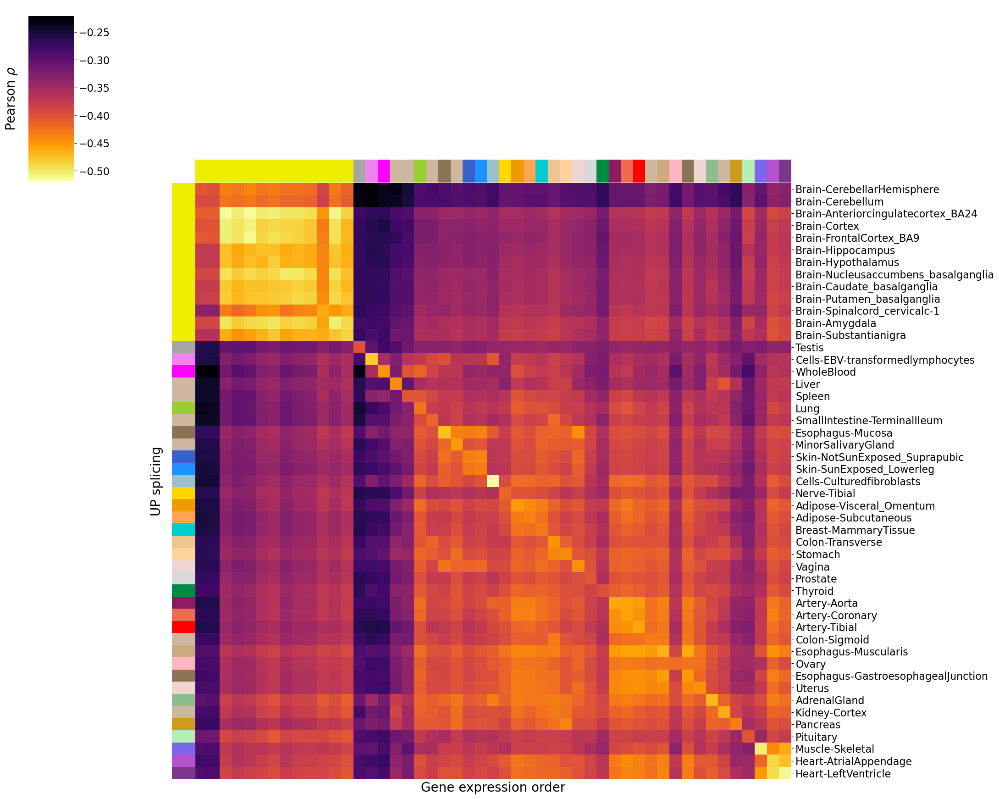

In [75]:

ga = sns.clustermap(rho_df.iloc[col_order, col_order], 
              col_cluster=False, row_cluster=False, col_colors=colores, row_colors=colores, cmap='inferno_r', figsize=(20,20))
ga.ax_heatmap.set_xticks([])
ga.ax_heatmap.tick_params(labelsize=16, which='both')
ga.ax_heatmap.set_xlabel('Gene expression order', fontsize=20)


ga.cax.yaxis.set_label_position("left")
ga.cax.set_ylabel("Pearson "+r"$\rho$", labelpad=15, fontsize=20)
ga.cax.tick_params(labelsize=16)

ga.ax_heatmap.yaxis.set_label_position("left")
ga.ax_heatmap.set_ylabel("UP splicing", labelpad=50, fontsize=20)
# ga.ax_heatmap.set_ylabel('')


plt.savefig('revision_plots/UP_splicing_by_exppression.corr_across_tissues.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.corr_across_tissues.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/UP_splicing_by_exppression.corr_across_tissues.svg', dpi=300, bbox_inches='tight')    

In [76]:
ordered_tissues = ['Testis', 'Liver',
       'Cells-EBV-transformedlymphocytes', 'WholeBlood',
                   'Cells-Culturedfibroblasts', 'Spleen', 'Lung',
       'SmallIntestine-TerminalIleum', 'Nerve-Tibial', 'Colon-Transverse',
       'Stomach', 'Vagina', 'Adipose-Visceral_Omentum', 'Adipose-Subcutaneous',
       'Breast-MammaryTissue', 'Prostate', 'Thyroid', 'Esophagus-Mucosa',
       'MinorSalivaryGland', 'Skin-NotSunExposed_Suprapubic',
       'Skin-SunExposed_Lowerleg', 'AdrenalGland', 'Kidney-Cortex', 'Pancreas',
       'Heart-AtrialAppendage', 'Heart-LeftVentricle', 'Esophagus-Muscularis',
       'Artery-Tibial', 'Colon-Sigmoid', 'Artery-Aorta', 'Artery-Coronary',
       'Ovary', 'Esophagus-GastroesophagealJunction', 'Uterus',
       'Muscle-Skeletal', 'Pituitary', 
       'Brain-CerebellarHemisphere', 'Brain-Cerebellum',
       'Brain-Spinalcord_cervicalc-1', 'Brain-Hippocampus',
       'Brain-Hypothalamus', 'Brain-Nucleusaccumbens_basalganglia',
       'Brain-Caudate_basalganglia', 'Brain-Putamen_basalganglia',
       'Brain-Anteriorcingulatecortex_BA24', 'Brain-Cortex',
       'Brain-FrontalCortex_BA9', 'Brain-Amygdala', 'Brain-Substantianigra']

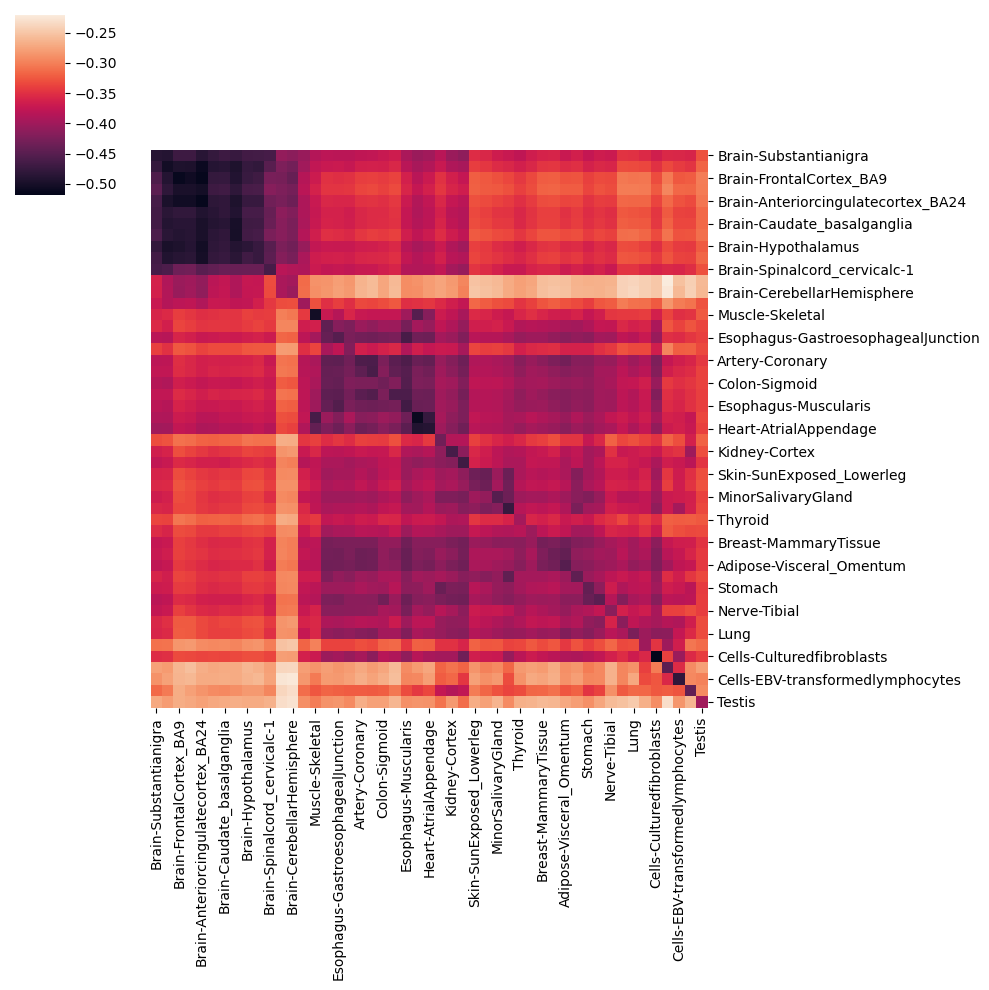

In [77]:
sns.clustermap(rho_df.T.loc[ordered_tissues[::-1], ordered_tissues[::-1]], 
              col_cluster=False, row_cluster=False)

In [79]:
# pearsonr(np.log1p(bc_splicing_expression.loc[bc_splicing_expression.nonPR_percentage > 0]['Brain-Cortex']), 
#          bc_splicing_expression.loc[bc_splicing_expression.nonPR_percentage > 0]['lognonPR'])

In [81]:
# plt.scatter(np.log1p(bc_splicing_expression.dropna()['Brain-Cortex']), 
#             bc_splicing_expression.dropna().lognonPR, alpha=0.2)

In [82]:
# pearsonr(np.log1p(bc_splicing_expression.loc[(bc_splicing_expression.counts_x >= 100) ].dropna()['Brain-Cortex']), 
#          bc_splicing_expression.loc[(bc_splicing_expression.counts_x >= 100) ].dropna().UP_percentage)

In [83]:
# 17770/(17770+134915)

In [84]:
ms_juncs = []
ms_class = []
with gzip.open('/project/yangili1/cfbuenabadn/SpliFi/code/results/pheno/noisy/GTEx/Muscle-Skeletal/leafcutter_perind_numers.counts.noise_by_intron.gz',
               'rb') as ms:
    ms.readline()
    for linea in tqdm(ms):
        junc = linea.decode().split(' ')[0]
        chrom, start, end, clu, annot = junc.split(':')
        strand = clu.split('_')[-1]

        out_junc = ':'.join([chrom, start, end, strand])

        ms_juncs.append(out_junc)
        ms_class.append(annot)


bc_juncs = []
bc_class = []
with gzip.open('/project/yangili1/cfbuenabadn/SpliFi/code/results/pheno/noisy/GTEx/Liver/leafcutter_perind_numers.counts.noise_by_intron.gz',
               'rb') as bc:
    bc.readline()
    for linea in tqdm(bc):
        junc = linea.decode().split(' ')[0]
        chrom, start, end, clu, annot = junc.split(':')
        strand = clu.split('_')[-1]

        out_junc = ':'.join([chrom, start, end, strand])

        bc_juncs.append(out_junc)
        bc_class.append(annot)

95357it [00:02, 46580.30it/s]
88952it [00:00, 133424.31it/s]


In [85]:
ms_df = pd.DataFrame()
ms_df['junction'] = ms_juncs
ms_df['ms_annot'] = ms_class


bc_df = pd.DataFrame()
bc_df['junction'] = bc_juncs
bc_df['bc_annot'] = bc_class

In [86]:
merged_df = ms_df.merge(bc_df, on='junction')